# 換色測試
測試目標:先運用kdtree分類法分類測試布料中三種主色的像素位置，再依找到的位置以HSV色彩偏移方法調整至目標替換顏色

In [1]:
import numpy as np
from sklearn.neighbors import KDTree
import matplotlib.pyplot as plt
import seaborn as sns
import cv2

img = cv2.imread('C:/Users/Alan/Desktop/Bilab/Bilab/WevearBird/color_shift/test_image/21265-1.jpg') 
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

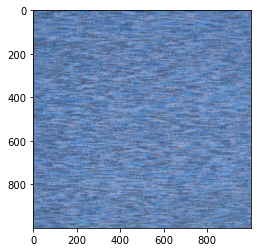

In [2]:
plt.imshow(img)
plt.show()

In [39]:
#帶入img已知的RGB色碼 (由布料開發資料獲得)
x = np.array([[40,60,100],[90,140,200],[170,190,230]])

#設定kd tree，x為分類標的
tree = KDTree(x)

for j in range(len(img)):
    #因為kdtree最多只能分類2維，因此採逐行進行kdtree分類, ind 為分類結果代號，例如 [0]表示結果為[40,60,100]
    dist, ind = tree.query(img[j],k=1)
    
    #逐行紀錄分類結果，且結果以二維形式以記錄個主色位置
    if j == 0:
        col_pos = [ind]
    else:
        col_pos = np.append(col_pos,[ind], axis =0)

col_pos=col_pos.astype(int)

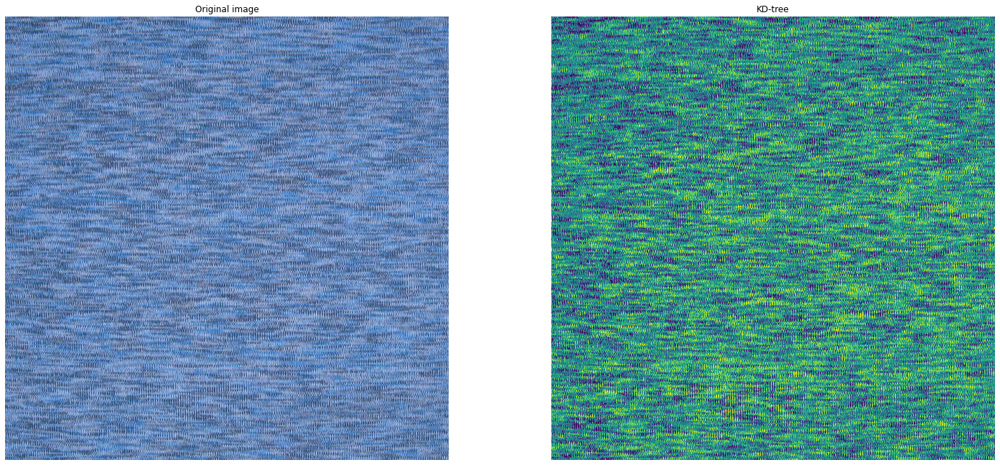

In [40]:
plt.figure(figsize = (25,25))
plt.subplot(2,2,1)
plt.axis('off')
plt.title('Original image')
plt.imshow(img)
plt.subplot(2,2,2)
plt.axis('off')
plt.title('KD-tree')
plt.imshow(col_pos)
plt.show()

[[255 255   0 ...   0   0   0]
 [255 255   0 ... 255   0 255]
 [  0 255   0 ... 255   0 255]
 ...
 [  0   0   0 ...   0   0   0]
 [  0   0   0 ...   0 255   0]
 [255   0   0 ... 255 255   0]]


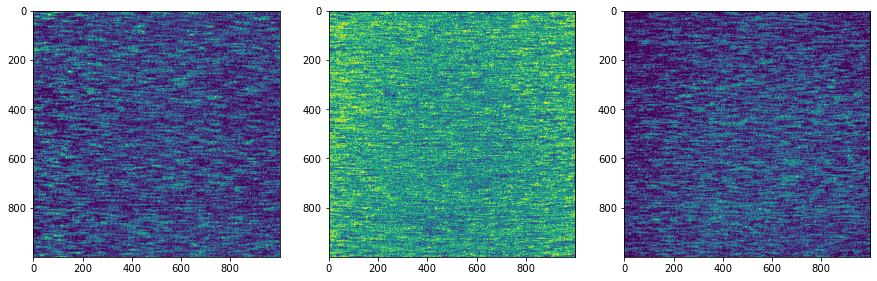

In [45]:
#取主色位置
#辨識到的位置會以255紀錄
color1 = cv2.inRange(col_pos, (0), (0)) 
color2 = cv2.inRange(col_pos, (1), (1))
color3 = cv2.inRange(col_pos, (2), (2))

#分別呈現三種主色的位置
plt.figure(figsize = (15,10))
plt.subplot(1,3,1)
plt.imshow(color1)
plt.subplot(1,3,2)
plt.imshow(color2)
plt.subplot(1,3,3)
plt.imshow(color3)
plt.show()

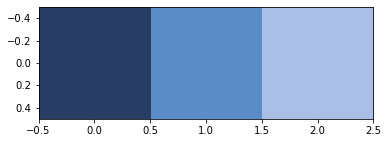

[[110 153 100]
 [106 140 200]
 [110  67 230]]


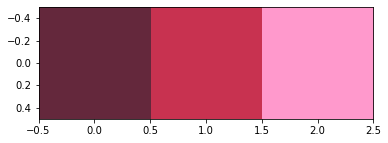

[[170 153 100]
 [174 191 200]
 [165 102 255]]
60 1.0 1.0
68 1.3642857 1.0
55 1.5223881 1.1086956


In [32]:
#將主色RGB轉為HSV 以進行色彩偏移
# plt.imshow(np.uint8([[[40,60,100],[90,140,200],[170,190,230]]]))
# plt.show()
main_hsv = cv2.cvtColor(np.uint8([[[40,60,100],[90,140,200],[170,190,230]]]), cv2.COLOR_RGB2HSV)
main_hsv = main_hsv[0]
# print(main_hsv)

#設定目標替換顏色並轉為 HSV
# plt.imshow(np.uint8([[[100,40,60],[200,50,80],[255,153,204]]]))
# plt.show()
target_hsv = cv2.cvtColor(np.uint8([[[100,40,60],[200,50,80],[255,153,204]]]), cv2.COLOR_RGB2HSV)
target_hsv = target_hsv[0]
# print(target_hsv)

#計算HSV顏色偏移量 (計算主色與目標顏色HSV值的差異，再將差異套用至原始圖檔以完成換色)
# H 為色調 範圍為[0-255]，因此以加減法調整
# S、V 分別為飽和度和亮度，測試後[0-255]較適合依比例調整

#color 1 與 目標顏色1 差異
H1 = int(target_hsv[0][0])-int(main_hsv[0][0])
S1 = target_hsv[0][1]/main_hsv[0][1]
V1 = target_hsv[0][2]/main_hsv[0][2]

#color 2 與 目標顏色2 差異
H2 = int(target_hsv[1][0])-int(main_hsv[1][0])
S2 = target_hsv[1][1]/main_hsv[1][1]
V2 = target_hsv[1][2]/main_hsv[1][2]

#color 3 與 目標顏色3 差異
H3 = int(target_hsv[2][0])-int(main_hsv[2][0])
S3 = target_hsv[2][1]/main_hsv[2][1]
V3 = target_hsv[2][2]/main_hsv[2][2]



In [53]:
#將原始圖檔img轉為HSV
original_hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
original_hsv = original_hsv.astype(int)

#掃過每個像素，若發現位置紀錄為255，則調整色彩
#color1
for i in range(len(color1)):
    for j in range(len(color1[i])):
        if color1[i][j] == 255:
            original_hsv[i][j][0] = original_hsv[i][j][0] + H1
            original_hsv[i][j][1] = original_hsv[i][j][1] * S1
            original_hsv[i][j][2] = original_hsv[i][j][2] * V1
            
#color2
for i in range(len(color2)):
    for j in range(len(color2[i])):
        if color2[i][j] == 255:
            original_hsv[i][j][0] = original_hsv[i][j][0] + H2
            original_hsv[i][j][1] = original_hsv[i][j][1] * S2
            original_hsv[i][j][2] = original_hsv[i][j][2] * V2
            
            
#color3            
for i in range(len(color3)):
    for j in range(len(color3[i])):
        if color3[i][j] == 255:
            original_hsv[i][j][0] = original_hsv[i][j][0] + H3
            original_hsv[i][j][1] = original_hsv[i][j][1] * S3
            original_hsv[i][j][2] = original_hsv[i][j][2] * V3
            
            
# 因>255後顯示會出現問題，所以當 pixel values become > 255, subtract 255
#H
hue = original_hsv[:,:,0]
cond = hue[:, :] > 255
hue[cond] = hue[cond] - 255
original_hsv[:,:,0] = hue

#S
val = original_hsv[:,:,2]
cond = val[:, :] > 255
val[cond] =  255
original_hsv[:,:,2] = val

#V
sat = original_hsv[:,:,1]
cond = sat[:, :] > 255
sat[cond] =  255
original_hsv[:,:,1] = sat


change_RGB = cv2.cvtColor(np.uint8(original_hsv), cv2.COLOR_HSV2RGB)


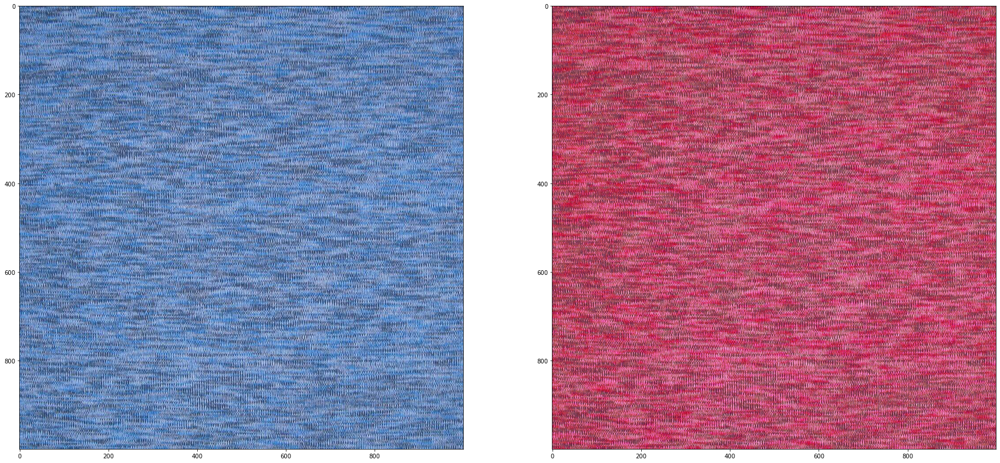

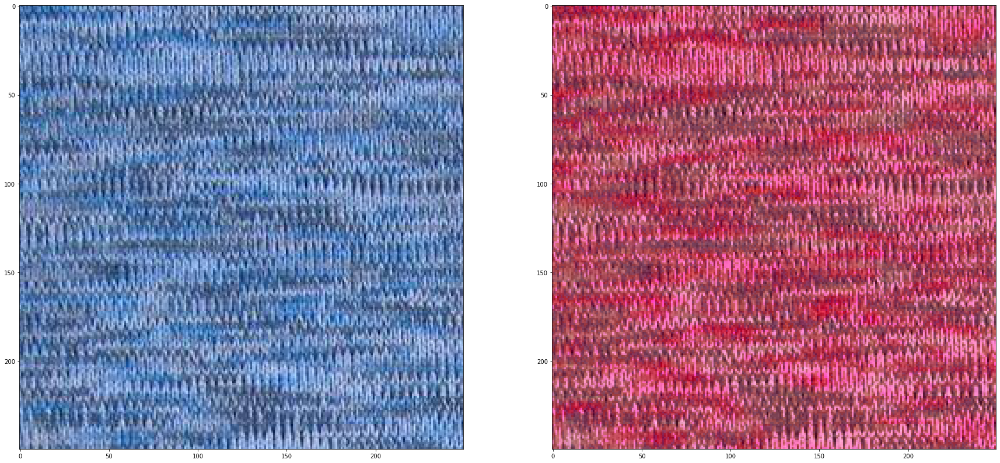

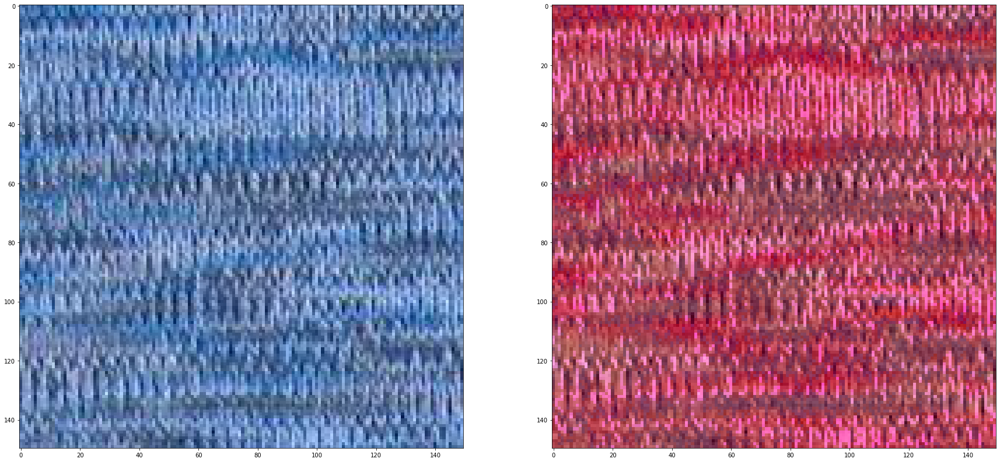

In [54]:
#此區顯示換色結果
# 裁切區域的 x 與 y 座標（左上角）
x = 100
y = 100

# 裁切區域的長度與寬度
w = 150
h = 150

# 裁切圖片
crop_250_original = img[y:y+250, x:x+250]
crop_250_change = change_RGB[y:y+250, x:x+250]
crop_150_original = img[y:y+h, x:x+w]
crop_150_change = change_RGB[y:y+h, x:x+w]

plt.figure(figsize = (30,30))
plt.subplot(1,2,1)
plt.imshow(img)
plt.subplot(1,2,2)
plt.imshow(change_RGB)
plt.show()
plt.figure(figsize = (30,30))
plt.subplot(1,2,1)
plt.imshow(crop_250_original)
plt.subplot(1,2,2)
plt.imshow(crop_250_change)
plt.show()
plt.figure(figsize = (30,30))
plt.subplot(1,2,1)
plt.imshow(crop_150_original)
plt.subplot(1,2,2)
plt.imshow(crop_150_change)
plt.show()

# 立肯真實布料測試
立肯使用的為Nike LAB色碼(L:亮度,A和B數值共同組成色彩)，雖與上方測試所用的RGB或HSV不同，但換色原理仍相同

In [56]:
import numpy as np
from sklearn.neighbors import KDTree
import matplotlib.pyplot as plt
import seaborn as sns
import cv2


#顏色資料
color_panel = {'00A':[16.28164526,-0.139671006,-2.140423332],
               '00J':[74.67823023,-6.272526362,5.788348812],
               '0AJ':[46.15147432,-2.225744225,-1.996746322],
               '3LY':[49.75767097,-40.21978273,2.389668356],
               '4AU':[74.18747242,-29.52216628,-17.84388332],
               '4EV':[34.58418048,6.245499014,-40.03091945],
               '4NB':[59.73138299,3.408616139,-36.60350167],
               '58L':[21.68368415,12.23390821,-13.48858196],
               '6GX':[79.08490304,28.25118997,11.42813522],
               '6JF':[70.83895373,48.25124822,13.81524688],
               '51L':[26.10722063,18.8296433,-30.84419615],
               '7AX':[90.59684813,-19.48518963,48.84987554],
               '31V':[30.20750886,-19.06960616,8.583617479],
               '57F':[77.84903912,3.001675522,-11.54836879],
               '65M':[49.23165628,40.93665365,8.622336817],
               '67P':[25.28306827,29.74874895,8.856231356],
               '85S':[54.68201306,58.86217375,24.99082533],
               '26B':[57.80837134,3.985584675,12.35855798]}
color_key = list(color_panel.keys())

#顏色換算: NIKE lab為OpenCV LAB (兩者僅是數值範圍不同，為方便使用色彩科學套件，因此換算為較常見的OpenCV Lab)
for i in color_key:
    color_panel[i][0]=color_panel[i][0]*255/100
    color_panel[i][1]=color_panel[i][1]+128
    color_panel[i][2]=color_panel[i][2]+128

        



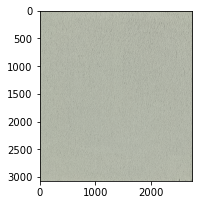

In [57]:
#讀取圖片
main='00J'
img = cv2.imread('C:/Users/Alan/Desktop/Bilab/Bilab/WevearBird/color_shift/test_image/TG3D'+main+'.png') 

#LAB
img_LAB = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
#RGB
img_RGB = cv2.cvtColor(img_LAB, cv2.COLOR_LAB2RGB)

plt.subplot(1,2,1)
plt.imshow(img_RGB)

#讀取主色資料
main_color=color_panel[main]


# 換色計算

In [12]:
#計算Lab差異，並進行調整
def color2color(img,main_color,target_color):
    L_diff = target_color[0]/main_color[0]
    A_diff = target_color[1]-main_color[1]
    B_diff = target_color[2]-main_color[2]
        
     
    img=np.float32(img)
    img[:,:,0]=img[:,:,0]*L_diff
    img[:,:,1]=img[:,:,1]+A_diff
    img[:,:,2]=img[:,:,2]+B_diff
    
    # if pixel values become > 255
    L = img[:,:,0]
    cond = L[:, :] > 255
    L[cond] = 255
    cond2 = L[:, :] < 0
    L[cond2] = 0
    changed_img[:,:,0] = L
    
    return img
    
    

epson RMSE: 0.17321         epson MSE: 0.03
TG3D RMSE: 0.1382           TG3D MSE: 0.0191
[101  46  44]

Blue


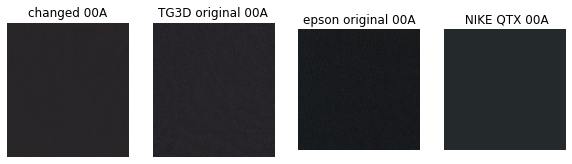

epson RMSE: 0.26797         epson MSE: 0.07181
TG3D RMSE: 0.0502           TG3D MSE: 0.00252
[ 60  18 187]

Green


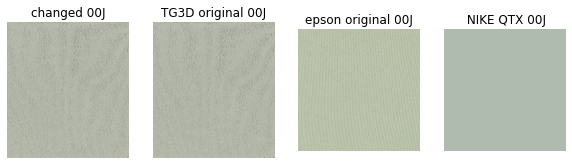

epson RMSE: 0.20957         epson MSE: 0.04392
TG3D RMSE: 0.37587           TG3D MSE: 0.14128
[ 96  23 112]

Blue


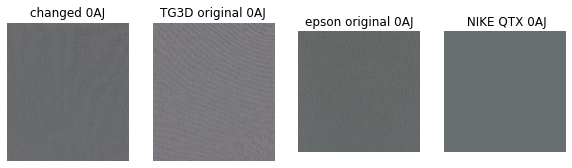

epson RMSE: 0.2986         epson MSE: 0.08916
TG3D RMSE: 0.43231           TG3D MSE: 0.18689
[ 85 255 135]

Blue


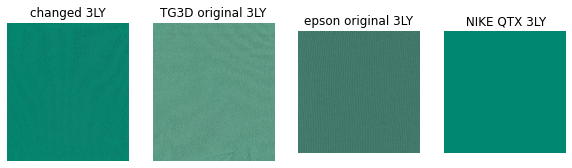

epson RMSE: 0.33044         epson MSE: 0.10919
TG3D RMSE: 0.38185           TG3D MSE: 0.14581
[ 93 173 214]

Blue


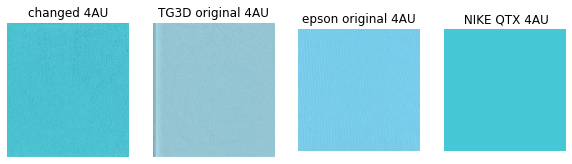

epson RMSE: 0.16559         epson MSE: 0.02742
TG3D RMSE: 0.25546           TG3D MSE: 0.06526
[105 224 147]

indigo


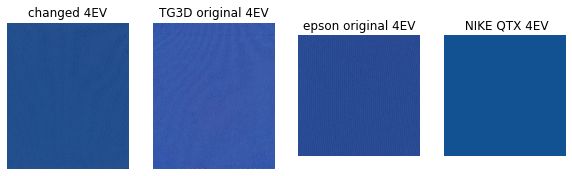

epson RMSE: 0.25521         epson MSE: 0.06513
TG3D RMSE: 0.37085           TG3D MSE: 0.13753
[108 130 208]

indigo


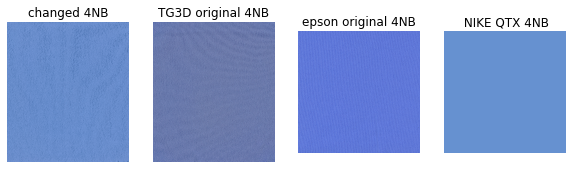

epson RMSE: 0.12104         epson MSE: 0.01465
TG3D RMSE: 0.19126           TG3D MSE: 0.03658
[135  92  72]

purple


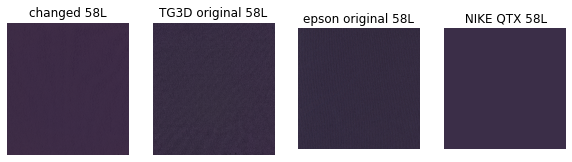

epson RMSE: 0.26056         epson MSE: 0.06789
TG3D RMSE: 0.30364           TG3D MSE: 0.0922
[  0  78 252]

RED


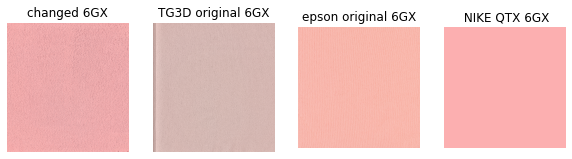

epson RMSE: 0.23527         epson MSE: 0.05535
TG3D RMSE: 0.27262           TG3D MSE: 0.07432
[176 120 255]

RED


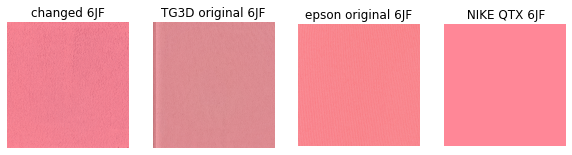

epson RMSE: 0.13401         epson MSE: 0.01796
TG3D RMSE: 0.17441           TG3D MSE: 0.03042
[123 129 109]

indigo


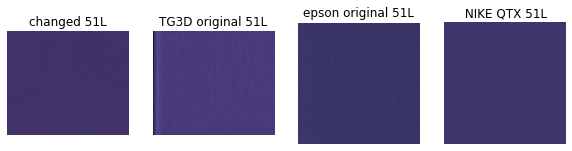

epson RMSE: 0.30627         epson MSE: 0.0938
TG3D RMSE: 0.35121           TG3D MSE: 0.12335
[ 34 111 237]

Yellow


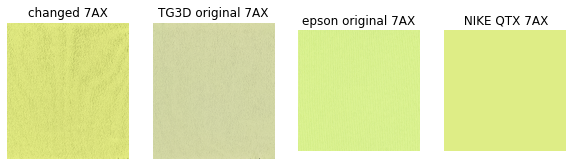

epson RMSE: 0.1429         epson MSE: 0.02042
TG3D RMSE: 0.21368           TG3D MSE: 0.04566
[ 75 132  79]

Blue


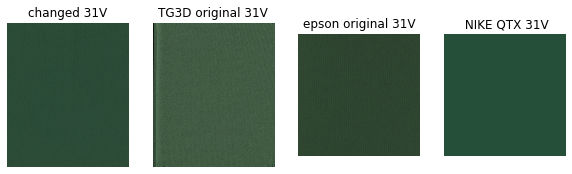

epson RMSE: 0.35215         epson MSE: 0.12401
TG3D RMSE: 0.30257           TG3D MSE: 0.09155
[115  33 214]

indigo


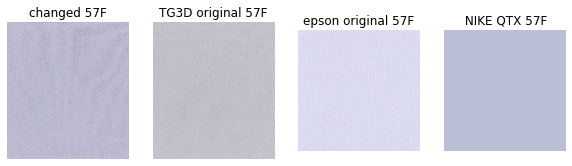

epson RMSE: 0.21515         epson MSE: 0.04629
TG3D RMSE: 0.28618           TG3D MSE: 0.0819
[174 132 181]

RED


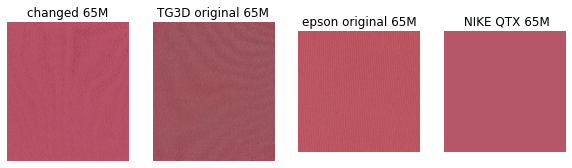

epson RMSE: 0.12141         epson MSE: 0.01474
TG3D RMSE: 0.19794           TG3D MSE: 0.03918
[175 157 101]

RED


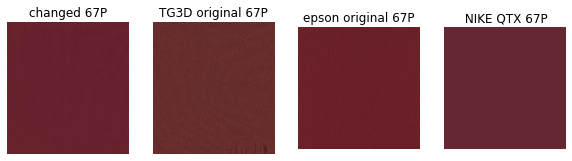

epson RMSE: 0.21206         epson MSE: 0.04497
TG3D RMSE: 0.30953           TG3D MSE: 0.09581
[177 166 226]

RED


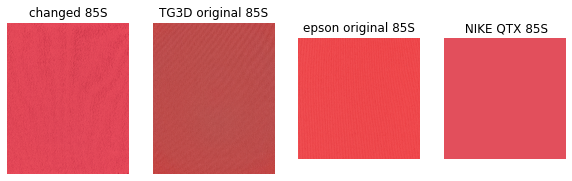

epson RMSE: 0.23616         epson MSE: 0.05577
TG3D RMSE: 0.33742           TG3D MSE: 0.11385
[ 16  57 152]

Yellow


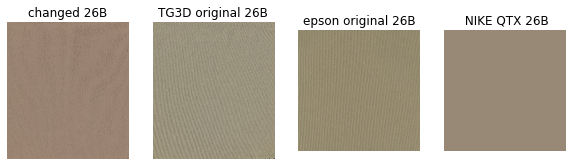

red
number of data: 5
RMSE: 0.273982
MSE: 0.076682
yellow
number of data: 2
RMSE: 0.34431500000000004
MSE: 0.11860000000000001
green
number of data: 1
RMSE: 0.0502
MSE: 0.00252
blue
number of data: 5
RMSE: 0.30838200000000004
MSE: 0.107748
indigo
number of data: 4
RMSE: 0.2758225
MSE: 0.08119000000000001
purple
number of data: 1
RMSE: 0.19126
MSE: 0.03658


In [18]:
#分色系
red=[]
yel=[]
gre=[]
blu=[]
ind=[]
pur=[]
    
for i in color_key:
    changed_img = color2color(img_LAB,main_color,color_panel[i])
    
    changed_img_save = cv2.cvtColor(np.uint8(changed_img), cv2.COLOR_LAB2BGR)
    cv2.imwrite('C:/Users/Alan/Desktop/Bilab/Bilab/WeaverBird/color_shift/output_image/TG3D/changed_'+i+'.jpg', changed_img_save)
    
    changed_img = cv2.cvtColor(np.uint8(changed_img), cv2.COLOR_LAB2RGB)
#     img_org = cv2.imread('C:/Users/Alan/Desktop/Bilab/Bilab/WeaverBird/color_shift/test__image/TG3D/'+i+'.png') 
#     img_org1 = cv2.imread('C:/Users/Alan/Desktop/Bilab/Bilab/WeaverBird/color_shift/test_image/'+i+'.jpg')
# #     img_org = cv2.resize(img_org, (256, 256))
#     img_org = cv2.cvtColor(img_org, cv2.COLOR_BGR2RGB)
#     img_org1 = cv2.cvtColor(img_org1, cv2.COLOR_BGR2RGB)
    
#     #計算epson MSE、RMSE
#     org_size = img_org1.shape
#     changed_img = cv2.resize(changed_img, (org_size[1],org_size[0]))
    
#     changed_32_img=np.float32(changed_img)
#     img_32_org=np.float32(img_org1)

#     error = (changed_32_img - img_32_org)/255
#     SE = error*error
#     MSE = round(np.sum(SE)/(org_size[0]*org_size[1]),5)
#     RMSE = round(MSE**0.5,5)
#     print('epson RMSE: '+ str(RMSE),'        epson MSE: '+ str(MSE))
    
#     #計算TG3D MSE、RMSE
#     org_size = img_org.shape
#     changed_img = cv2.resize(changed_img, (org_size[1],org_size[0]))
    
#     changed_32_img=np.float32(changed_img)
#     img_32_org=np.float32(img_org)

#     error = (changed_32_img - img_32_org)/255
#     SE = error*error
#     MSE = round(np.sum(SE)/(org_size[0]*org_size[1]),5)
#     RMSE = round(MSE**0.5,5)
#     print('TG3D RMSE: '+ str(RMSE),'          TG3D MSE: '+ str(MSE))
    
    

    
#     #計算分色系誤差
#     QTX=cv2.cvtColor(np.uint8([[color_panel[i]]]), cv2.COLOR_LAB2RGB)
#     QTX=cv2.cvtColor(QTX, cv2.COLOR_RGB2HSV)
#     print(QTX[0][0])
    
#     print()
#     if QTX[0][0][0] <15 or QTX[0][0][0] >= 165:
#         red.append((RMSE,MSE))
#         print('RED')
#     elif QTX[0][0][0] >=15 and QTX[0][0][0] < 45:
#         yel.append((RMSE,MSE))
#         print('Yellow')
#     elif QTX[0][0][0] >=45 and QTX[0][0][0] < 75:
#         gre.append((RMSE,MSE))
#         print('Green')
#     elif QTX[0][0][0] >=75 and QTX[0][0][0] < 105:
#         blu.append((RMSE,MSE))
#         print('Blue')
#     elif QTX[0][0][0] >=105 and QTX[0][0][0] < 135:
#         ind.append((RMSE,MSE))
#         print('indigo')
#     elif QTX[0][0][0] >=135 and QTX[0][0][0] < 165:
#         pur.append((RMSE,MSE))
#         print('purple')


#     plt.figure(figsize = (10,10))
#     plt.subplot(1,4,1)
#     plt.axis('off')
#     plt.imshow(changed_img)
#     plt.title('changed '+ i)
#     plt.subplot(1,4,2)
#     plt.axis('off')
#     plt.imshow(img_org)
#     plt.title('TG3D original '+ i)
#     plt.subplot(1,4,3)
#     plt.axis('off')
#     plt.imshow(img_org1)
#     plt.title('epson original '+ i)
#     plt.subplot(1,4,4)
#     plt.axis('off')
#     plt.imshow(cv2.cvtColor(np.uint8([[color_panel[i]]]), cv2.COLOR_LAB2RGB))
#     plt.title(' NIKE QTX '+i)
#     plt.show()

# for t in ['red','yellow','green','blue','indigo','purple']:
#     RMSE=0
#     MSE = 0
#     if len(locals()[t[:3]])>0:
#         for i in locals()[t[:3]]:
#             RMSE+= i[0]
#             MSE+= i[1]
#         print(t)
#         print('number of data: '+str(len(locals()[t[:3]])))
#         print('RMSE: '+str(RMSE/len(locals()[t[:3]])))
#         print('MSE: '+str(MSE/len(locals()[t[:3]])))

